In [1]:
import os
from pathlib import Path
from typing import Union, List, Optional
import numpy as np
import audiotools
import auraloss
import pandas as pd
from audiotools import AudioSignal

import matplotlib.pyplot as plt
import torch
import helper
import IPython.display as ipd
# dir(helper)

NOTEBOOKS_DIR = Path(os.path.abspath(''))
PROJECT_DIR = NOTEBOOKS_DIR.parent
ASSETS_DIR = PROJECT_DIR / "assets"
PRETRAINED_DIR = PROJECT_DIR / "pretrained"
DATA_DIR = PROJECT_DIR / "data"
RUNS_DIR = PROJECT_DIR / "runs"
EXPERIMENTS_DIR = PROJECT_DIR / "experiments"

CLAP_OUTPUT_FOLDER = RUNS_DIR / "test123"
LAION_CLAP_OUTPUTS =CLAP_OUTPUT_FOLDER / "laion_clap" 
MS_CLAP_OUTPUTS = CLAP_OUTPUT_FOLDER / "ms_clap" 
AUDEALIZE_GND_TRUTH_DIR = EXPERIMENTS_DIR / "audealize_comp"  / "audealize_version"

top10_eq = ["warm", "cold", "soft", "loud", "happy", "bright", "soothing", "harsh", "heavy", "cool"]

### May 26: Testing123 Audealize vs MS CLAP vs LAION-CLAP: 
- FX: Just EQ
- Audio Type: Single Guitar Riff
- Words: Top 10 Frequent EQ words (warm 64, cold 34, soft 29, loud 26, happy 22, bright 19, soothing 17, harsh 16, heavy 15, cool 14)
- Test Folder: runs/test123
- Test Description: for ms_clap and laion_clap, I ran 8 trials per top10_eq word total: 5 random init_params seeds, 3 from zero



#### Checking Test Folder Contents

In [2]:
# checking contents
keyword = 'guitar'
run_number = "zeros_0" #other options are "seed1_0... seed5_0 or zeros_0 up to zeros_3"

# Loading Ground Truth Paths
audealize_out_ALL = helper.load_and_find_path_with_keyword(AUDEALIZE_GND_TRUTH_DIR, [f'{keyword}'], returnSingle=False)
print(len(audealize_out_ALL)) #checking length, should be number of words aka 10
# for path in audealize_out_ALL:
#     print(path)

# Loading all MS CLAP output files
msclap_out_ALL = helper.load_and_find_path_with_keyword(MS_CLAP_OUTPUTS, [f'{keyword}', f'{run_number}', "final"])
print(len(msclap_out_ALL))  #checking length, should be number of words aka 10
# for path in msclap_out_ALL:
#     print(path)

# Loading all MS CLAP output files
laionclap_out_ALL = helper.load_and_find_path_with_keyword(LAION_CLAP_OUTPUTS, [f'{keyword}', f'{run_number}', "final"])
print(len(laionclap_out_ALL))  #checking length, should be number of words aka 10
# for path in laionclap_out_ALL:
#     print(path)

10
10
10


#### Some Extra Helper Functions...

In [3]:
def calc_loss_allwords_onefile_oneaudio(model_output_dir, target_words=top10_eq, audio_type = 'guitar', run_version =  'seed0', loss_func=auraloss.freq.MultiResolutionSTFTLoss(), verbose=True):
    losses = {}
    for word in target_words:
        audealize_out_word = helper.load_and_find_path_with_keyword(AUDEALIZE_GND_TRUTH_DIR, [f"{audio_type}", f"{word}"], returnSingle=True)
        clap_out_word = helper.load_and_find_path_with_keyword(model_output_dir, [f"{audio_type}", "final", f"{word}", f"{run_version}"], returnSingle=True)
        losses[word] = helper.compare_loss_files_preprocessed(audealize_out_word, clap_out_word, loss_func) #normalized
       
        if verbose:
            print(f'AUDEALIZE_OUT PATH: {audealize_out_word}')
            print(f'CLAP_OUT PATH: {clap_out_word}')

    return pd.DataFrame(list(losses.items()), columns=['word', 'loss'])     # Convert the losses dictionary to a DataFrame
   
def compute_mean_and_std(tensors):
    stacked_tensors = torch.stack(tensors)
    mean_tensor = torch.mean(stacked_tensors)
    std_tensor = torch.std(stacked_tensors)
    return mean_tensor.item(), std_tensor.item()


def calc_loss_allwords_allfiles_oneaudio(clap_output_dir=MS_CLAP_OUTPUTS, target_words=top10_eq, audio_type = 'guitar', run_type = 'seed'):
    results = []
    for word in target_words:
        allseeds_paths = helper.load_and_find_path_with_keyword(clap_output_dir, [f"{audio_type}", "final", f"{word}", f"{run_type}"],returnSingle=False)
        audealize_out_word = helper.load_and_find_path_with_keyword(AUDEALIZE_GND_TRUTH_DIR,[f"{audio_type}", f"{word}"], returnSingle=True)
        seed_losses_all = [helper.compare_loss_files_preprocessed(audealize_out_word, seed_path) for seed_path in allseeds_paths]
        average, std = compute_mean_and_std(seed_losses_all)         # Calculate the average and std
        results.append({'word': word, 'average': average, 'std': std})
    print(f'num of files averaged {clap_output_dir} {len(seed_losses_all)}')
    return pd.DataFrame(results)

 
def plot_loss(df, run_version, avg=False):
    plt.figure(figsize=(8, 6))
    bar_width = 0.35
    index = np.arange(len(df['word']))
    if avg==True:
        label_plus = f'multiple'
        plt.bar(index - bar_width/2, df['average_MS_CLAP'], yerr=df['std_MS_CLAP'], capsize=5, width=bar_width, label='MS_CLAP')
        plt.bar(index + bar_width/2, df['average_LAION_CLAP'], yerr=df['std_LAION_CLAP'], capsize=5, width=bar_width, alpha=0.5, label='LAION_CLAP')
        plt.title('Average STFT Loss by Word (over multiple runs)')
    else:
        label_plus = f'single'
        plt.bar(index - bar_width/2, df['loss_MS_CLAP'], capsize=5, width=bar_width, label='MS_CLAP')
        plt.bar(index + bar_width/2, df['loss_LAION_CLAP'], capsize=5, width=bar_width, alpha=0.5, label='LAION_CLAP')
    plt.title(f'STFT Loss by Word (runs: {label_plus} run, {run_version})')
    plt.xlabel('Word')
    plt.ylabel('STFT Loss (lower is BETTER)')
    plt.xticks(index, df['word'], rotation=45)
    plt.legend()
    
    plt.tight_layout()
    plt.show()


#### calculate for a single run

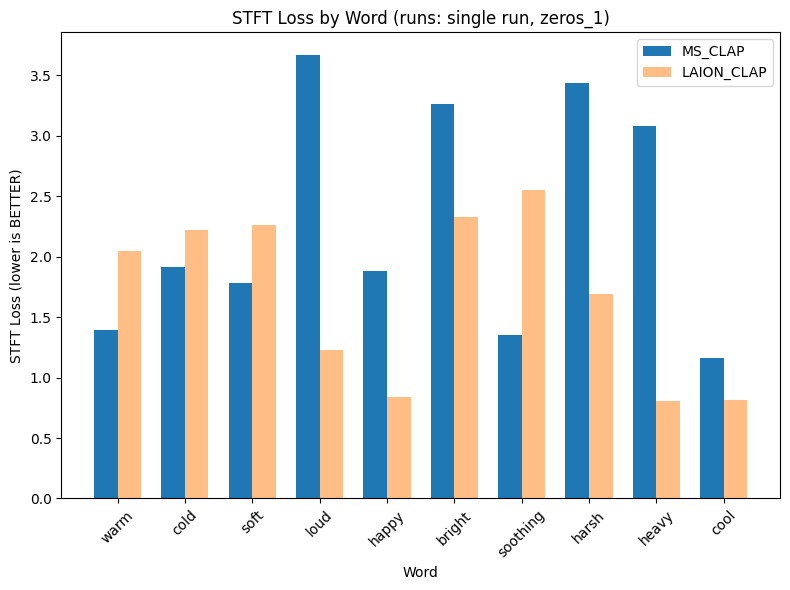

comparing single runs // warm / zeros_1 / guitar
audealize ground truth



signal being comparing:/home/annie/research/text2fx/runs/test123/ms_clap/guitar/warm/zeros_1/final.wav



signal being comparing:/home/annie/research/text2fx/runs/test123/laion_clap/guitar/warm/zeros_1/final.wav


In [4]:
# calculate for a single run
run_version = 'zeros_1'
audio_type = 'guitar'
# def calc_loss_allwords_onefile_oneaudio(model_output_dir, target_words=top10_eq, audio_type = 'guitar', run_version =  'seed0', loss_func=auraloss.freq.MultiResolutionSTFTLoss(), verbose=True):

ms_clap_single_run = calc_loss_allwords_onefile_oneaudio(MS_CLAP_OUTPUTS, top10_eq, audio_type, run_version, verbose=False)
laion_clap_single_run = calc_loss_allwords_onefile_oneaudio(LAION_CLAP_OUTPUTS, top10_eq, audio_type, run_version, verbose=False)
all_clap_single_run = pd.merge(ms_clap_single_run, laion_clap_single_run, on='word', suffixes=('_MS_CLAP', '_LAION_CLAP'))

plot_loss(all_clap_single_run, run_version, avg=False)

#comparing audio 1 file
word = 'warm'
load_aud_gnd_truth = helper.load_and_find_path_with_keyword(AUDEALIZE_GND_TRUTH_DIR,[f"{audio_type}", f"{word}"], returnSingle=True)
comp_msclap_out = helper.load_and_find_path_with_keyword(MS_CLAP_OUTPUTS, [f"{audio_type}", "final", f"{word}", f"{run_version}"],returnSingle=True)
comp_laionclap_out = helper.load_and_find_path_with_keyword(LAION_CLAP_OUTPUTS, [f"{audio_type}", "final", f"{word}", f"{run_version}"],returnSingle=True)

print(f'comparing single runs // {word} / {run_version} / {audio_type}')
print('audealize ground truth')
aud_gnd_truth = helper.preprocess_audio(load_aud_gnd_truth)
ipd.display(ipd.Audio(aud_gnd_truth.samples.squeeze(), rate=aud_gnd_truth.sample_rate)) # aud_gnd_truth.widget()

print(f'\nsignal being comparing:{comp_msclap_out}' )
sig_comp_msclap_out = helper.preprocess_audio(comp_msclap_out)
ipd.display(ipd.Audio(sig_comp_msclap_out.samples.squeeze(), rate=sig_comp_msclap_out.sample_rate)) #sig_comp_msclap_out.widget()

print(f'\nsignal being comparing:{comp_laionclap_out}')
sig_comp_laionclap_out = helper.preprocess_audio(comp_laionclap_out)
ipd.display(ipd.Audio(sig_comp_laionclap_out.samples.squeeze(), rate=sig_comp_laionclap_out.sample_rate)) #sig_comp_msclap_out.widget()

#### Averaging all runs loss values for single word by run type

In [5]:
# Averaging all runs loss values for single word by run type
run_type = 'seed' #change; options to specity type of run "", "zero", "seed", or to specify a specific run 'zero_{i}' i in [0,2] or 'seed{i}_0' i in [0,4]
target_word = 'warm' #change
audio_type = 'guitar' #fixed

audealize_out_word = helper.load_and_find_path_with_keyword(AUDEALIZE_GND_TRUTH_DIR, [f"{audio_type}", f"{target_word}"], returnSingle=True)

clap_dir = MS_CLAP_OUTPUTS #change

allseeds_paths = helper.load_and_find_path_with_keyword(clap_dir, [f"{audio_type}", "final", f"{target_word}", f"{run_type}"], returnSingle=False)
seed_losses_all = [helper.compare_loss_files_preprocessed(audealize_out_word, seed_path) for seed_path in allseeds_paths]

print(f'num of output .wavs averaged // ({len(allseeds_paths)})')
print(f'output .wavs // {[str(path).split("/test123/")[1] for path in allseeds_paths]}')
print(f'mean & std loss // {compute_mean_and_std(seed_losses_all)}\n')

print("=========== AUDEALIZE GND_TRUTH ============\n")
aud_gnd_sig = helper.preprocess_audio(audealize_out_word) #to_mono, resampled to 441000, normalized, #AudioSignal(audealize_out_word).to_mono().normalize(-24)
ipd.display(ipd.Audio(aud_gnd_sig.samples.squeeze(), rate=aud_gnd_sig.sample_rate))
# print(aud_gnd_sig)

print("=========== MS CLAP OUTPUTS .WAVS ============\n")
for seed_path in allseeds_paths:
    print(f">> {str(seed_path).split('/test123/')[1]} >>")
    print(f'STFT loss: {helper.compare_loss_files_preprocessed(audealize_out_word, seed_path)}')
    seed_sig = helper.preprocess_audio(str(seed_path))
    audio = ipd.Audio(seed_sig.samples.squeeze(), rate=seed_sig.sample_rate)
    ipd.display(audio)



num of output .wavs averaged // (5)
output .wavs // ['ms_clap/guitar/warm/seed0_0/final.wav', 'ms_clap/guitar/warm/seed3_0/final.wav', 'ms_clap/guitar/warm/seed1_0/final.wav', 'ms_clap/guitar/warm/seed2_0/final.wav', 'ms_clap/guitar/warm/seed4_0/final.wav']
mean & std loss // (2.477907419204712, 1.1406331062316895)

=========== AUDEALIZE GND_TRUTH ============



=========== MS CLAP OUTPUTS .WAVS ============

>> ms_clap/guitar/warm/seed0_0/final.wav >>
STFT loss: 1.9823509454727173


>> ms_clap/guitar/warm/seed3_0/final.wav >>
STFT loss: 1.4587535858154297


>> ms_clap/guitar/warm/seed1_0/final.wav >>
STFT loss: 3.854307174682617


>> ms_clap/guitar/warm/seed2_0/final.wav >>
STFT loss: 1.543099284172058


>> ms_clap/guitar/warm/seed4_0/final.wav >>
STFT loss: 3.551025390625


In [8]:
# Averaging all runs loss values for single word by run type
run_type = 'zero' #change; options to specity type of run "", "zero", "seed", or to specify a specific run 'zero_{i}' i in [0,2] or 'seed{i}_0' i in [0,4]
target_word = 'warm' #change
audio_type = 'guitar' #fixed

audealize_out_word = helper.load_and_find_path_with_keyword(AUDEALIZE_GND_TRUTH_DIR, [f"{audio_type}", f"{target_word}"], returnSingle=True)

clap_dir = LAION_CLAP_OUTPUTS #change

allseeds_paths = helper.load_and_find_path_with_keyword(clap_dir, [f"{audio_type}", "final", f"{target_word}", f"{run_type}"], returnSingle=False)
seed_losses_all = [helper.compare_loss_files_preprocessed(audealize_out_word, seed_path) for seed_path in allseeds_paths]

print(f'num of output .wavs averaged // ({len(allseeds_paths)})')
print(f'output .wavs // {[str(path).split("/test123/")[1] for path in allseeds_paths]}')
print(f'mean & std loss // {compute_mean_and_std(seed_losses_all)}\n')

print("=========== AUDEALIZE GND_TRUTH ============\n")
aud_gnd_sig = helper.preprocess_audio(audealize_out_word) #to_mono, resampled to 441000, normalized, #AudioSignal(audealize_out_word).to_mono().normalize(-24)
ipd.display(ipd.Audio(aud_gnd_sig.samples.squeeze(), rate=aud_gnd_sig.sample_rate))
# print(aud_gnd_sig)

print("=========== LAION CLAP OUTPUTS .WAVS ============\n")
for seed_path in allseeds_paths:
    # print(seed_path)
    print(f">> {str(seed_path).split('/test123/')[1]} >>")
    print(f'STFT loss: {helper.compare_loss_files_preprocessed(audealize_out_word, seed_path)}')
    seed_sig = helper.preprocess_audio(str(seed_path))
    audio = ipd.Audio(seed_sig.samples.squeeze(), rate=seed_sig.sample_rate)
    ipd.display(audio)



num of output .wavs averaged // (3)
output .wavs // ['laion_clap/guitar/warm/zeros_2/final.wav', 'laion_clap/guitar/warm/zeros_1/final.wav', 'laion_clap/guitar/warm/zeros_0/final.wav']
mean & std loss // (2.033134698867798, 0.024000151082873344)

=========== AUDEALIZE GND_TRUTH ============



=========== LAION CLAP OUTPUTS .WAVS ============

>> laion_clap/guitar/warm/zeros_2/final.wav >>
STFT loss: 2.005431890487671


>> laion_clap/guitar/warm/zeros_1/final.wav >>
STFT loss: 2.0476341247558594


>> laion_clap/guitar/warm/zeros_0/final.wav >>
STFT loss: 2.0463383197784424


num of files averaged /home/annie/research/text2fx/runs/test123/ms_clap 8
num of files averaged /home/annie/research/text2fx/runs/test123/laion_clap 8
       word  average_MS_CLAP  std_MS_CLAP  average_LAION_CLAP  std_LAION_CLAP
0      warm         2.070985     1.029007            2.213825        0.895541
1      cold         2.244541     0.537609            2.492734        0.357815
2      soft         2.077635     0.461723            2.263950        0.658263
3      loud         3.672136     0.505190            1.565818        0.846013
4     happy         2.032044     0.320647            1.423409        0.784377
5    bright         3.613363     0.711759            2.478062        0.349818
6  soothing         1.268435     0.373116            2.078560        0.703868
7     harsh         3.866085     0.454942            2.068381        0.779672
8     heavy         3.171534     0.349478            1.055469        0.327695
9      cool         1.483907     0.439372            1.446392        

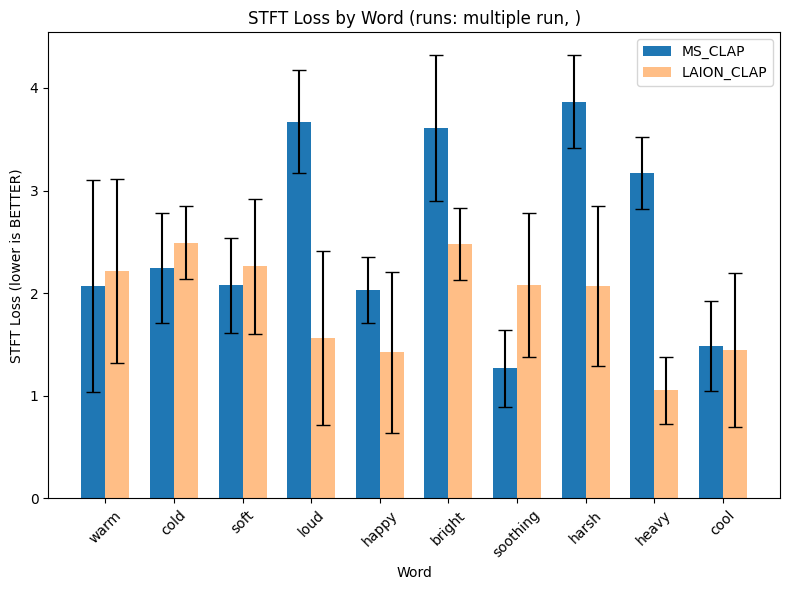

In [7]:
#testing 123
run_version = '' #or '' for all or 'zero' for the zeros

ms_clap_word_stats = calc_loss_allwords_allfiles_oneaudio(MS_CLAP_OUTPUTS, top10_eq, 'guitar', run_version)
laion_clap_word_stats = calc_loss_allwords_allfiles_oneaudio(LAION_CLAP_OUTPUTS, top10_eq, 'guitar', run_version)
all_clap_stats = pd.merge(ms_clap_word_stats, laion_clap_word_stats, on='word', suffixes=('_MS_CLAP', '_LAION_CLAP'))
print(all_clap_stats)
plot_loss(all_clap_stats, run_version, avg=True)
